# Finding outliers

1. differenze vanno al quadrato
2. Find z-score
3. gaussiana 1/e^sigma

To do: 
- Take quadrants of LH_009 and bare Si
- H_p003 was good but had to remove it because maybe resampling did not good to it

In [1]:
import os
import sys

import numpy as np

%matplotlib nbagg
%reload_ext autoreload
%autoreload 2
import matplotlib
import matplotlib.lines as mlines
import matplotlib.pyplot as plt

from matplotlib import cm
from skimage import data, img_as_float, filters

from scipy.optimize import curve_fit
from scipy.ndimage import gaussian_filter

import cv2
import plotly.graph_objects as go

from scipy.stats import zscore

%reload_ext autoreload
%autoreload 2
%aimport AFM_lib

In [6]:
debug = True #or 'False' when you do not want to debug

path = "/Users/sfiligoj/Desktop/Thesis/Data Analysis/AFM/SSP"

os.chdir(path)
filess = os.listdir()
filess = [f for f in filess if f.endswith('txt')]

NEW = "Plotly images/svg"
if not os.path.exists(NEW):
    os.mkdir(NEW)

In [3]:
#open dictionary of Scan Size values:
with open('ScanSizes.json', 'r') as f:
    ScanSize_dict = json.loads(f.read())

Resampling file: Ru_H_asdep_FLAT.001.txt
running file:Ru_H_asdep_FLAT.001.txt


<IPython.core.display.Javascript object>


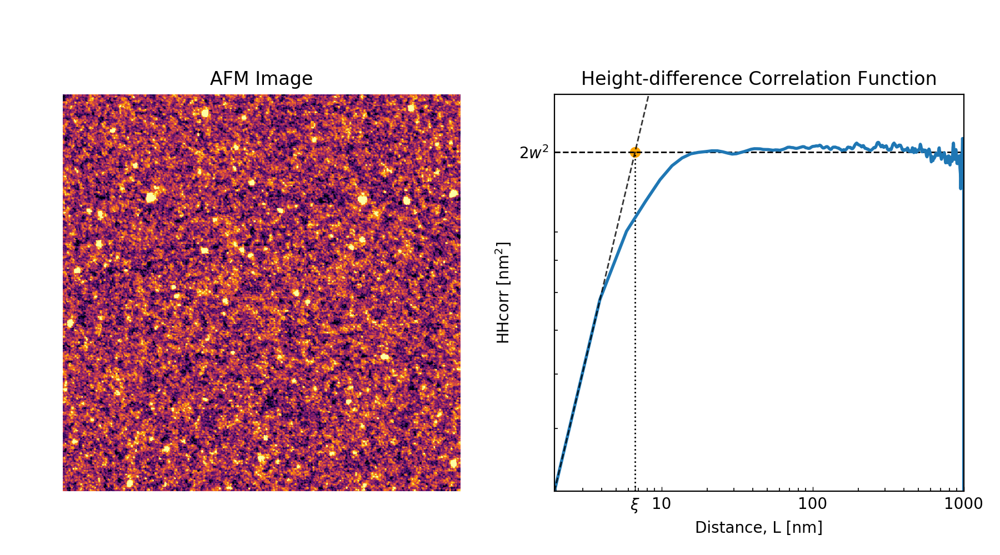

running file:Ru_H_asdep_FLAT.003.txt


<IPython.core.display.Javascript object>


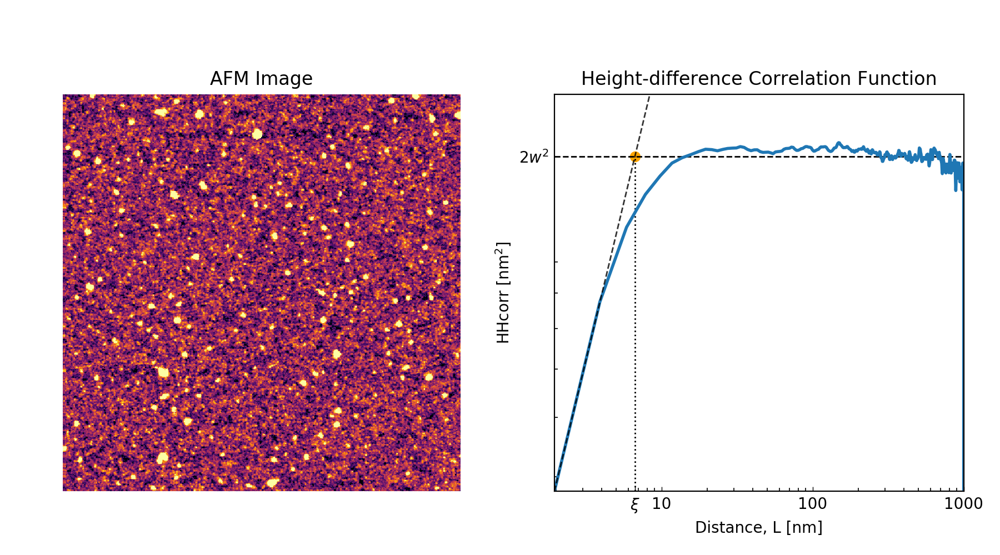

running file:Ru_H_asdep_1um_FLAT_106.txt


<IPython.core.display.Javascript object>


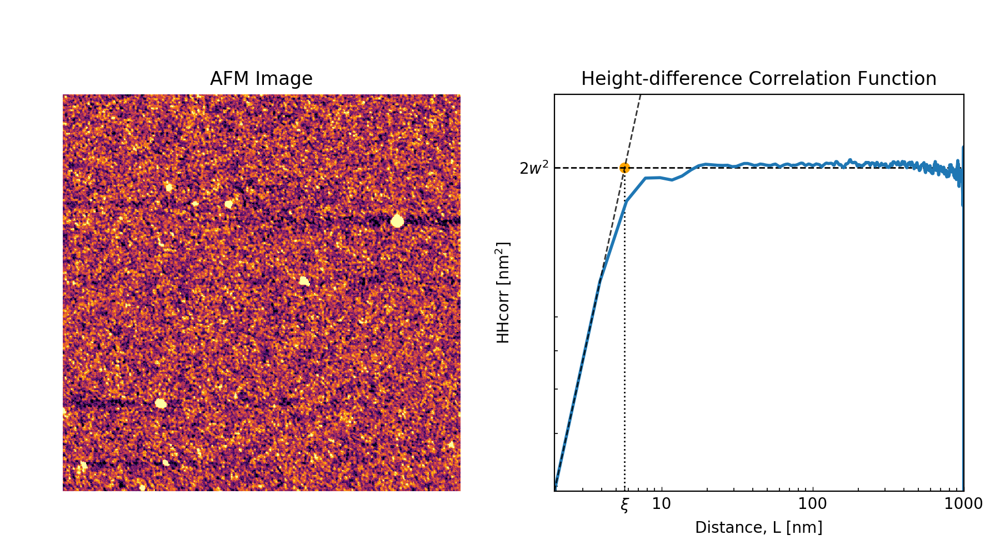

running file:Ru_LH_asdep_FLAT.023.txt


<IPython.core.display.Javascript object>


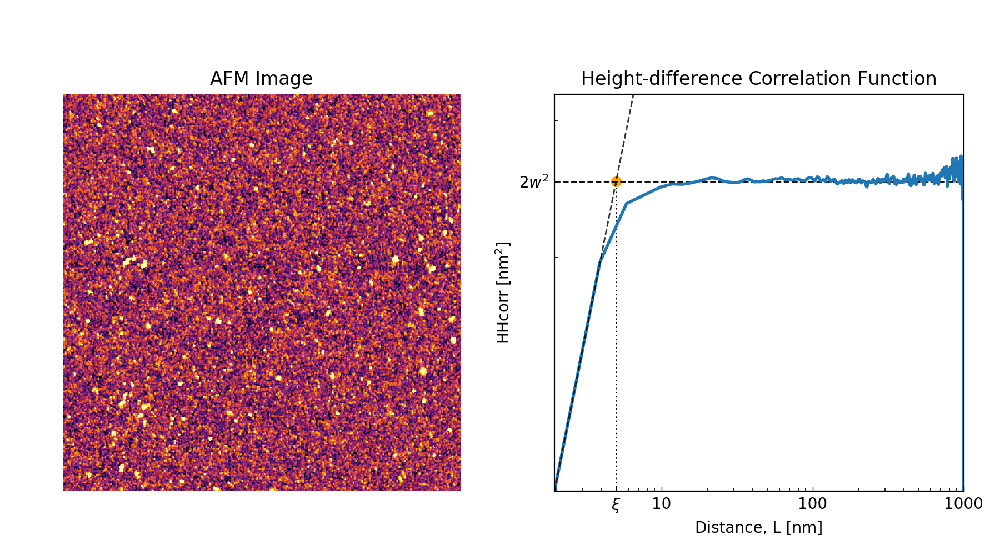

running file:Ru_LH_asdep_FLAT.022.txt


<IPython.core.display.Javascript object>


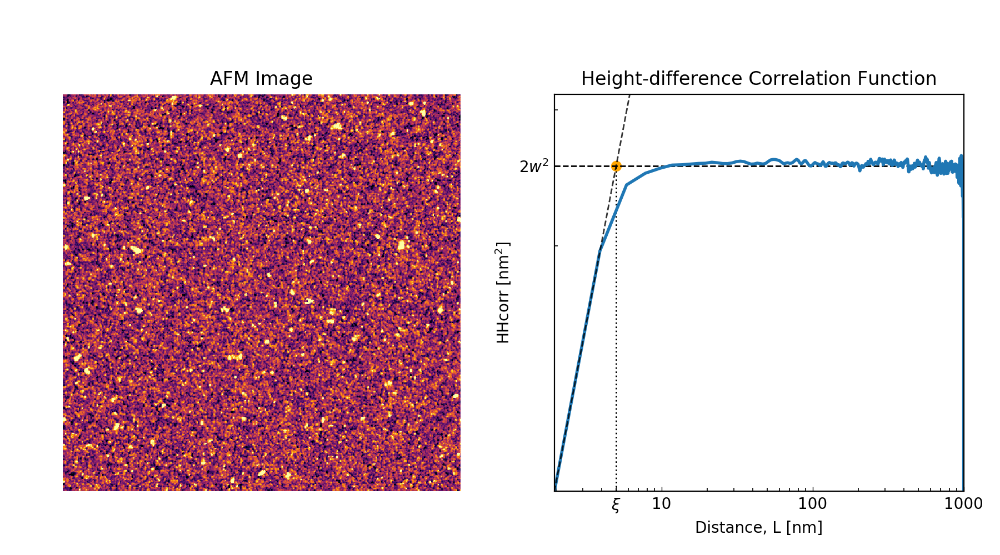

running file:Ru_LH_asdep_FLAT.009.txt


<IPython.core.display.Javascript object>


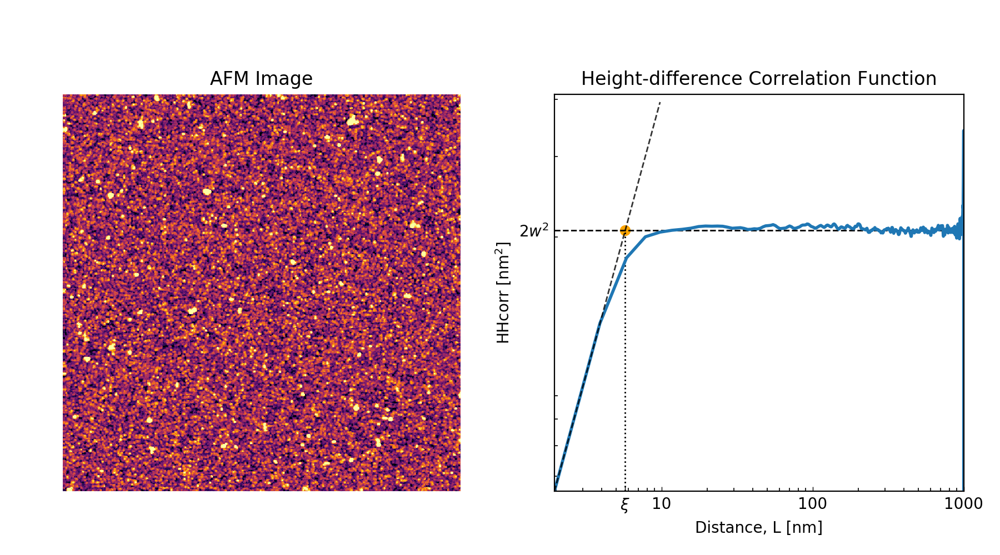

running file:Ru_H_asdep_FLAT.117.txt


<IPython.core.display.Javascript object>


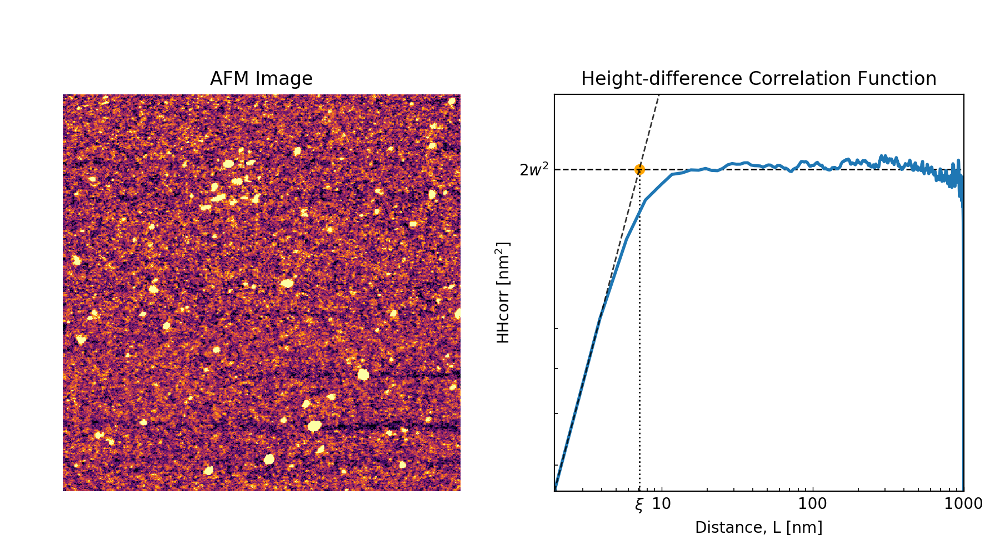

running file:Ru_L_asdep_FLAT.004.txt


<IPython.core.display.Javascript object>


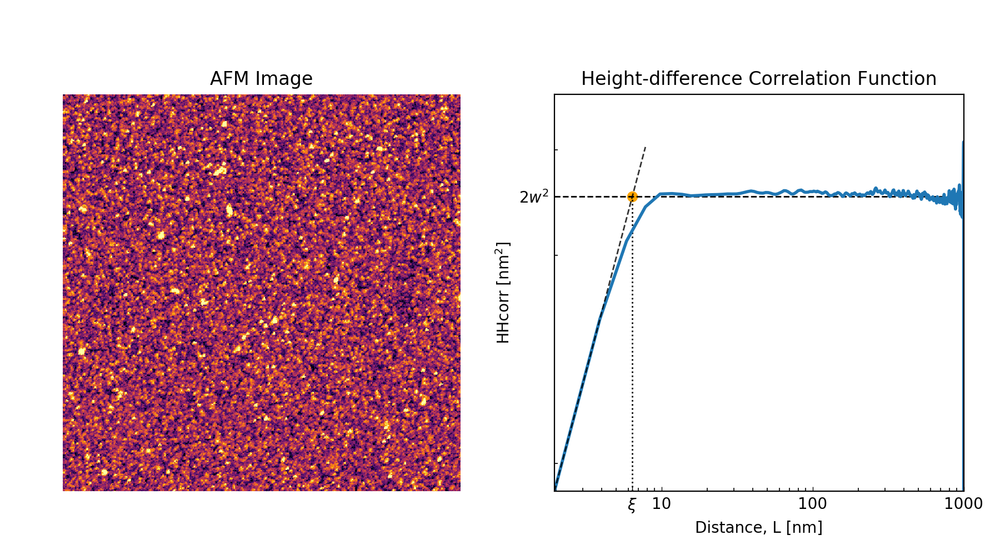

running file:Ru_L_asdep_FLAT.000.txt


<IPython.core.display.Javascript object>


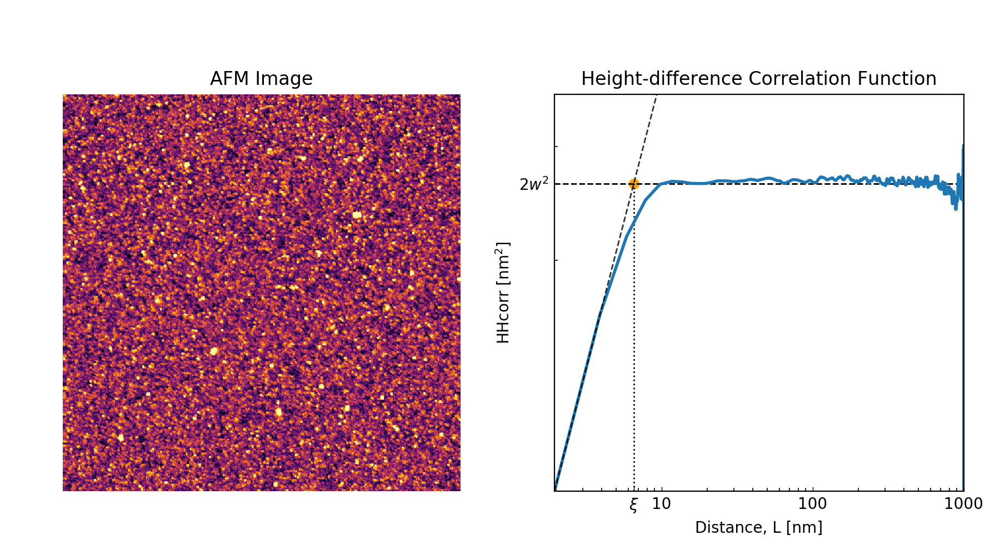

running file:Ru_L_asdep_FLAT.002.txt


<IPython.core.display.Javascript object>


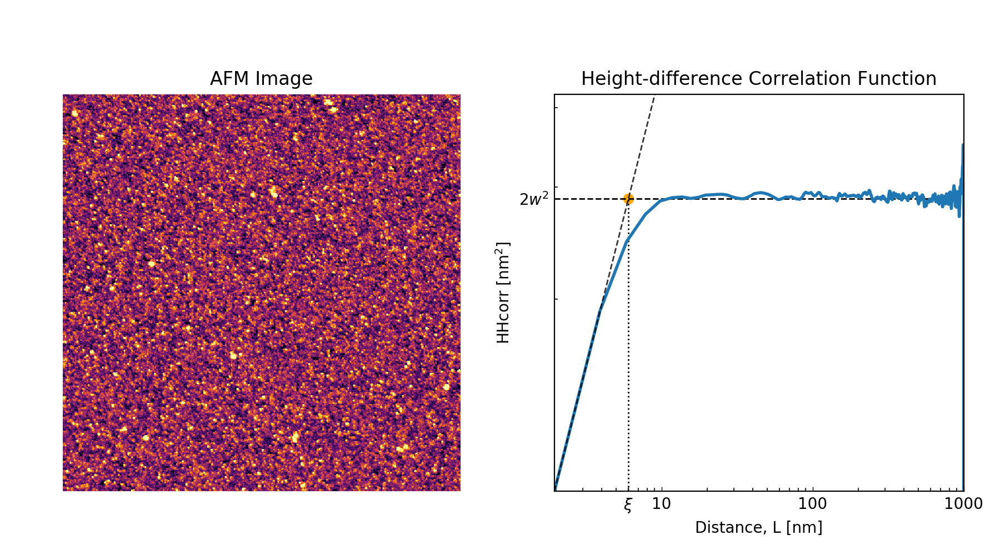

running file:Ru_S_Bare_Si_FLAT.txt


<IPython.core.display.Javascript object>


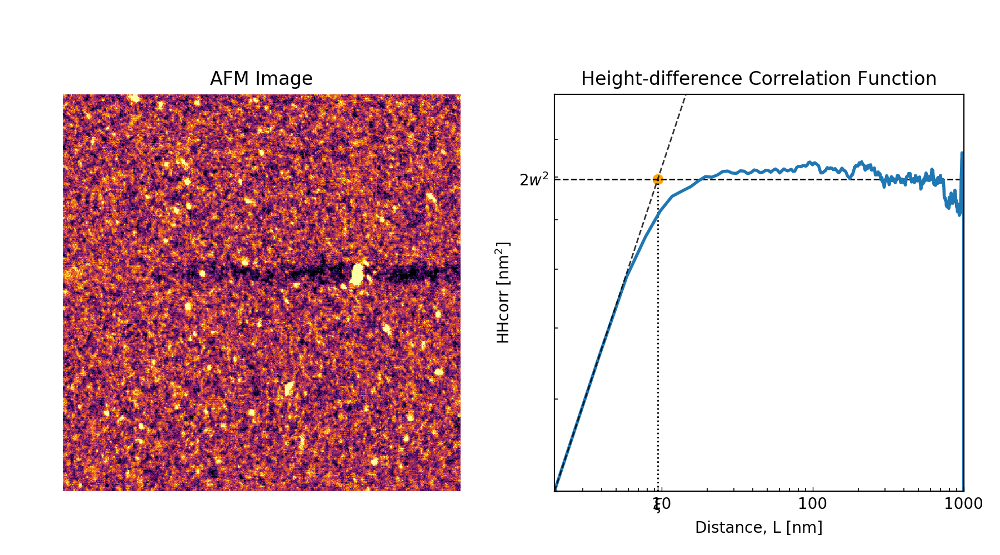

In [16]:
data = dict.fromkeys(filess)
np.seterr(all='raise')

# https://personal.sron.nl/~pault/#sec:qualitative
# https://plotly.com/python/builtin-colorscales/#using-builtin-continuous-color-scales
# https://colorbrewer2.org/#type=qualitative&scheme=Set2&n=3
# colors=['#004488', '#DDAA33', '#BB5566', '#000000']
#       ' black      orange     blue      cyan      magenta      red       teal      gray'
colors=['#000000','#EE7733', '#0077BB', '#33BBEE', '#EE3377', '#CC3311','#009988', '#BBBBBB']
Z_score = 3.5

for i,file in enumerate(filess[:]):
    
    if '*' in file:
        continue  
    elif 'nm' in file:
        continue  
    elif '10um' in file:
        continue
    elif '5um' in file:
        continue
        
    elif '_H_' in file:
#         continue
        density = 'High'
        pressure = 'Low-pressure Ru'
        color = colors[2]
        if 'asdep' in file:
#             continue
            temperature = 'as-deposited'
        else:
            continue
            temperature = temperature = file[5:9]             
    elif '_L_' in file:
#         continue
        density = 'Low'
        pressure = 'High-pressure Ru'
        color = colors[4]
        if 'asdep' in file:
#             continue
            temperature = 'as-deposited'
        else:
            continue
            temperature = temperature = file[5:9]          
    elif '_LH_' in file:
#         continue
        density = 'Low-High'
        pressure = "Variable-pressure Ru"
        color = colors[6]
        if 'asdep' in file:
#             continue
            temperature = 'as-deposited'
        else:
            continue
            temperature = temperature = file[6:10]
    if '_Si_' in file:
#         continue
        density = 'Si(100)'
        pressure = 'Si(100)'
        color = colors[0]
        temperature = 'substrate'

    filesize = os.path.getsize(file)     
    Pix_width = int(np.sqrt(filesize/32))
    Pix_height = Pix_width
     
    data[file]={}
    data[file]['orig'] = np.genfromtxt(file, skip_header=1).reshape((Pix_width,Pix_height))
    
    if Pix_width == 1024:
        print(f"Resampling file: {file}")
        # overwrites the original data with the downsampled one:
        data[file]['orig'] = cv2.resize(data[file]['orig'], 
                                        dsize=(512,512),
                                        interpolation=cv2.INTER_LINEAR)
        
    if Pix_width == 256:
        print(f"Resampling file: {file}")
        data[file]['orig'] = cv2.resize(data[file]['orig'], dsize=(512,512),interpolation=cv2.INTER_LINEAR)
    
    data[file]['img'] = AFM_lib.remove_outliers(data[file]['orig'],threshold=Z_score)   
        
    N_Pixel_line = data[file]['img'].shape[1] 
    ScanSize = ScanSize_dict[file]                       # nm
    StepSize = ScanSize/N_Pixel_line                     # nm/px   
    Xdelta = np.linspace(StepSize, ScanSize, num=N_Pixel_line)
        
    print(f'running file:{file}')

    # ***    Calculate theoretical asymptotic value of the Height difference correlation: 2w^2   ***

    HeightSq = (data[file]['img'])**2                        
    RMS_sq = np.mean(HeightSq)        
    RMS = np.sqrt(RMS_sq)

    # ***    Calculate Height-Height correlation function:   ***

    HHcorr = AFM_lib.calc_HHcorr(data[file]['img'])
    autocorr = AFM_lib.calc_autocorr(data[file]['img'])

    # ***    Fit the data:   ***
    
    CutoffPointPLaw = int(np.argwhere(HHcorr >=2*RMS_sq)[0])
    # For some files, cutoff = 30, which makes the weight infintely large (calculated few lines below).
    # To work around this problem, I explicitly set any value above 20 equal to 15.
    if CutoffPointPLaw > 20:
        CutoffPointPLaw = 15
        
    a0=0
    y_err = np.arange(a0,CutoffPointPLaw+a0)**2
    weights = np.exp(y_err)

    Model = lambda x, a, alpha: a*x**(2*alpha)
    popt, pcov = curve_fit(Model, Xdelta[a0:CutoffPointPLaw+a0], HHcorr[a0:CutoffPointPLaw+a0], 
                           sigma = weights)


    # ***    Extracting the correlation length   ***

    #*popt= a,alpha
    a = popt[0]                                         # primo parametro dipendente
    alpha = popt[1]                                     # secondo paramtero dipendente
    # Equating a*(x**alpha)= 2*RMS_sq you extract x, the correlation length
    CorrLength = (1/a *(2*RMS_sq))**(1/(2*alpha))
    
    
    # ***    Plot and save results:
    
           
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize = (9,5))
    ax = np.ravel(ax)

    #Take contrast correction from image without outliers
    p2, p98 = np.percentile(data[file]['img'], (0.5, 99.5))
    #Original image, with contrast correction p2,p8 applied:
    AFM = ax[0].imshow(data[file]['orig'], cmap = 'inferno', vmin= p2, vmax = p98)
    ax[0].axis('off')
    ax[0].set_title(f"AFM Image")

    ax[1].loglog(Xdelta, HHcorr, label = 'HHcorr', linewidth = 2, alpha=1)
            #and its errors:
            #plt.errorbar(Xdelta, HHcorr, yerr=e, fmt=".")

    # plot the fit
    ax[1].loglog(Xdelta[:CutoffPointPLaw], 
                 Model(Xdelta[:CutoffPointPLaw],*popt), 
                 label = 'Fit', 
                 linewidth = 1, 
                 linestyle='dashed', 
                 alpha = 0.8, color ='k')

    # show correlation length 
    ax[1].scatter(CorrLength, 2*RMS_sq, marker='o', color='orange')
    ax[1].vlines(CorrLength,HHcorr[0],2*RMS_sq, linestyle="dotted", linewidth=1)
    ax[1].hlines(2*RMS_sq, Xdelta[0], Xdelta[N_Pixel_line-2], linestyle="dashed",linewidth=1)

    # plt.legend()
    ax[1].tick_params(direction='in', length=3, width=0.5, colors='k')
    ax[1].set(xticks=(1,10,CorrLength,100, ScanSize))
    ax[1].set(xticklabels=(0,10,'$\\xi $',100,ScanSize))
    ax[1].set(yticks=(1,2*RMS_sq))
    ax[1].set_yticklabels(('','$2w^2$'))
    ax[1].tick_params(axis='x', which='minor', direction ='in', bottom=True)
    ax[1].tick_params(axis='y', which='minor', direction ='in',labelleft=False)


    ax[1].set(ylabel='HHcorr [nm$^2$]')
    ax[1].set(xlabel='Distance, L [nm]')
    ax[1].set_title(f"Height-difference Correlation Function")

    ax[1].set_xlim(Xdelta[0], ScanSize)
    ax[1].set_ylim(HHcorr[0], 1.2*max(HHcorr))

    fig.tight_layout()

#     sup_title = f"File{file[-7:-4]}: HH-function for {temperature} {density} density Ru - $\\xi $ = {CorrLength:.4} nm"
#     sup_title = f"Height-difference correlation function for {temperature} {pressure} - $\\xi $ = {CorrLength:.4} nm"
#     fig.suptitle(sup_title, fontsize=14)
    fig.subplots_adjust(top=0.83)

    fig.savefig(f'Plotly images/svg/HH function for {temperature} {pressure} - {file[-7:-4]}.svg', dpi=600)
    fig.savefig(f'Plotly images/svg/HH function for {temperature} {pressure} - {file[-7:-4]}.png', dpi=600)